<a href="https://colab.research.google.com/github/plaban1981/Langchain_usecases/blob/main/Ask_questions_to_an_image_with_Python%2C_and_Langchain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -qU openai langchain transformers tabulate timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 907.7/907.7 kB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 85.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 57.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 71.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.0/90.0 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 117.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

#### Import Required libraries

In [8]:
from langchain.tools import BaseTool
from transformers import BlipProcessor, BlipForConditionalGeneration, DetrImageProcessor, DetrForObjectDetection
from PIL import Image
import torch
#
import os
from tempfile import NamedTemporaryFile
from langchain.agents import initialize_agent
from langchain.chat_models import ChatOpenAI
from langchain.chains.conversation.memory import ConversationBufferWindowMemory

## Generate Tool

In [3]:
class ImageCaptionTool(BaseTool):
    name = "Image captioner"
    description = "Use this tool when given the path to an image that you would like to be described. " \
                  "It will return a simple caption describing the image."

    def _run(self, img_path):
        image = Image.open(img_path).convert('RGB')

        model_name = "Salesforce/blip-image-captioning-large"
        device = "cpu"  # cuda

        processor = BlipProcessor.from_pretrained(model_name)
        model = BlipForConditionalGeneration.from_pretrained(model_name).to(device)

        inputs = processor(image, return_tensors='pt').to(device)
        output = model.generate(**inputs, max_new_tokens=20)

        caption = processor.decode(output[0], skip_special_tokens=True)

        return caption

    def _arun(self, query: str):
        raise NotImplementedError("This tool does not support async")


class ObjectDetectionTool(BaseTool):
    name = "Object detector"
    description = "Use this tool when given the path to an image that you would like to detect objects. " \
                  "It will return a list of all detected objects. Each element in the list in the format: " \
                  "[x1, y1, x2, y2] class_name confidence_score."

    def _run(self, img_path):
        image = Image.open(img_path).convert('RGB')

        processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
        model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

        inputs = processor(images=image, return_tensors="pt")
        outputs = model(**inputs)

        # convert outputs (bounding boxes and class logits) to COCO API
        # let's only keep detections with score > 0.9
        target_sizes = torch.tensor([image.size[::-1]])
        results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

        detections = ""
        for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
            detections += '[{}, {}, {}, {}]'.format(int(box[0]), int(box[1]), int(box[2]), int(box[3]))
            detections += ' {}'.format(model.config.id2label[int(label)])
            detections += ' {}\n'.format(float(score))

        return detections

    def _arun(self, query: str):
        raise NotImplementedError("This tool does not support async")

## Define Helper Functions

In [4]:
def get_image_caption(image_path):
    """
    Generates a short caption for the provided image.

    Args:
        image_path (str): The path to the image file.

    Returns:
        str: A string representing the caption for the image.
    """
    image = Image.open(image_path).convert('RGB')

    model_name = "Salesforce/blip-image-captioning-large"
    device = "cpu"  # cuda

    processor = BlipProcessor.from_pretrained(model_name)
    model = BlipForConditionalGeneration.from_pretrained(model_name).to(device)

    inputs = processor(image, return_tensors='pt').to(device)
    output = model.generate(**inputs, max_new_tokens=20)

    caption = processor.decode(output[0], skip_special_tokens=True)

    return caption


def detect_objects(image_path):
    """
    Detects objects in the provided image.

    Args:
        image_path (str): The path to the image file.

    Returns:
        str: A string with all the detected objects. Each object as '[x1, x2, y1, y2, class_name, confindence_score]'.
    """
    image = Image.open(image_path).convert('RGB')

    processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
    model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

    inputs = processor(images=image, return_tensors="pt")
    outputs = model(**inputs)

    # convert outputs (bounding boxes and class logits) to COCO API
    # let's only keep detections with score > 0.9
    target_sizes = torch.tensor([image.size[::-1]])
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

    detections = ""
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        detections += '[{}, {}, {}, {}]'.format(int(box[0]), int(box[1]), int(box[2]), int(box[3]))
        detections += ' {}'.format(model.config.id2label[int(label)])
        detections += ' {}\n'.format(float(score))

    return detections


## Testing Helper Functions

In [6]:
image_path = '/content/pexels-key-notez-1625235.jpg'
detections = detect_objects(image_path)
print(detections)

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


[1176, 2077, 3021, 3414] person 0.9967302083969116



In [7]:
get_image_caption(image_path)

'someone holding a cone of ice cream with a rainbow topping'

## Main Processing

In [16]:
import openai
from getpass import getpass
openai_api_key = getpass()

··········


In [18]:
tools = [ImageCaptionTool(), ObjectDetectionTool()]

conversational_memory = ConversationBufferWindowMemory(
    memory_key='chat_history',
    k=5,
    return_messages=True
)

llm = ChatOpenAI(
    openai_api_key= openai_api_key,
    temperature=0,
    model_name="gpt-3.5-turbo"
)

agent = initialize_agent(
    agent="chat-conversational-react-description",
    tools=tools,
    llm=llm,
    max_iterations=5,
    verbose=True,
    memory=conversational_memory,
    early_stopping_method='generate'
)


## Display the image

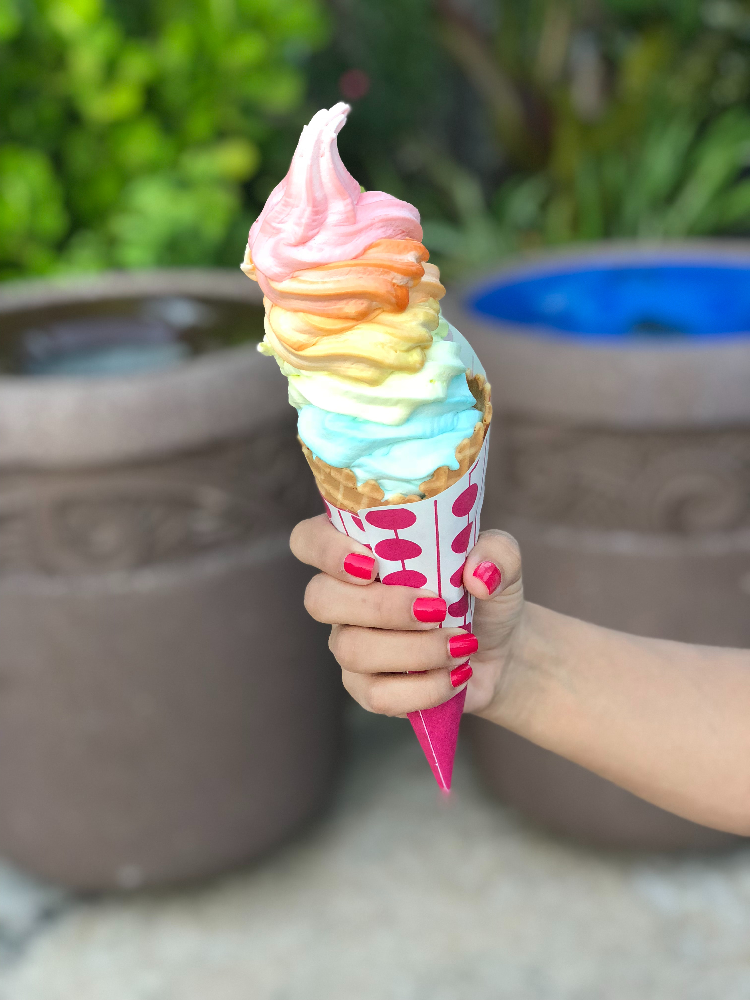

In [13]:
from IPython.display import display
import PIL
display(PIL.Image.open(image_path))

In [14]:
user_question = "What is this image about?"

In [19]:
response = agent.run(f'{user_question}, this is the image path: {image_path}')



> Entering new AgentExecutor chain...
{
    "action": "Image captioner",
    "action_input": "/content/pexels-key-notez-1625235.jpg"
}
Observation: someone holding a cone of ice cream with a rainbow topping
Thought:{
    "action": "Final Answer",
    "action_input": "The image is of someone holding a cone of ice cream with a rainbow topping."
}

> Finished chain.


In [20]:
print(response)

The image is of someone holding a cone of ice cream with a rainbow topping.


## Example -2 

In [21]:
user_question = "Please tell me the bounding boxes of all detected objects in the image."

In [22]:
response = agent.run(f'{user_question}, this is the image path: {image_path}')



> Entering new AgentExecutor chain...
{
    "action": "Object detector",
    "action_input": "/content/pexels-key-notez-1625235.jpg"
}
Observation: [1176, 2077, 3021, 3414] person 0.9967302083969116

Thought:{
    "action": "Final Answer",
    "action_input": "The detected object in the image is a person with a bounding box of [1176, 2077, 3021, 3414]."
}

> Finished chain.


In [23]:
print(response)

The detected object in the image is a person with a bounding box of [1176, 2077, 3021, 3414].


## Image2

In [24]:
! wget https://www.smartcitiesworld.net/AcuCustom/Sitename/DAM/019/Parsons_PR.jpg

--2023-05-25 12:02:07--  https://www.smartcitiesworld.net/AcuCustom/Sitename/DAM/019/Parsons_PR.jpg
Resolving www.smartcitiesworld.net (www.smartcitiesworld.net)... 52.48.243.29, 54.229.44.112
Connecting to www.smartcitiesworld.net (www.smartcitiesworld.net)|52.48.243.29|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 299237 (292K) [image/jpeg]
Saving to: ‘Parsons_PR.jpg’

Parsons_PR.jpg      100%[===================>] 292.22K  --.-KB/s    in 0.08s   

2023-05-25 12:02:07 (3.79 MB/s) - ‘Parsons_PR.jpg’ saved [299237/299237]



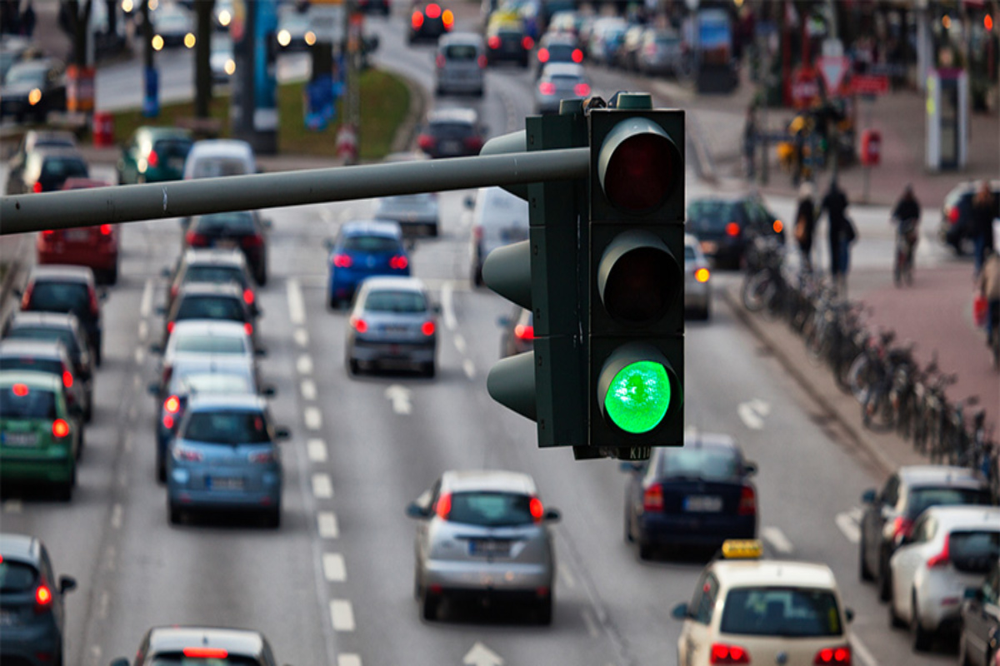

In [34]:
from IPython.display import display
import PIL
display(PIL.Image.open(image_path))

In [25]:
image_path = "/content/Parsons_PR.jpg"
user_question = "Please tell me the bounding boxes of all detected objects in the image."
response = agent.run(f'{user_question}, this is the image path: {image_path}')




> Entering new AgentExecutor chain...
{
    "action": "Object detector",
    "action_input": "/content/Parsons_PR.jpg"
}
Observation: [518, 40, 582, 110] car 0.9300937652587891
[188, 381, 311, 469] car 0.9253759384155273
[1068, 223, 1104, 342] person 0.987162172794342
[828, 233, 949, 329] car 0.9450376629829407
[1076, 263, 1106, 347] bicycle 0.9070376753807068
[635, 71, 713, 135] car 0.921174168586731
[0, 433, 100, 603] car 0.9781951308250427
[151, 747, 339, 799] car 0.9839044809341431
[389, 267, 493, 367] car 0.9801359176635742
[192, 478, 341, 633] car 0.995318591594696
[578, 117, 828, 550] traffic light 0.9860804677009583
[802, 666, 1028, 798] car 0.982887327671051
[0, 639, 84, 799] car 0.9630037546157837
[1057, 608, 1199, 766] car 0.9652799367904663
[988, 218, 1031, 347] person 0.9471640586853027
[751, 524, 909, 675] car 0.9911800026893616
[489, 560, 670, 749] car 0.9970000386238098

Thought:{
    "action": "Final Answer",
    "action_input": "The detected objects in the image are

In [26]:
print(response)

The detected objects in the image are: 
[518, 40, 582, 110] car 
[188, 381, 311, 469] car 
[1068, 223, 1104, 342] person 
[828, 233, 949, 329] car 
[1076, 263, 1106, 347] bicycle 
[635, 71, 713, 135] car 
[0, 433, 100, 603] car 
[151, 747, 339, 799] car 
[389, 267, 493, 367] car 
[192, 478, 341, 633] car 
[578, 117, 828, 550] traffic light 
[802, 666, 1028, 798] car 
[0, 639, 84, 799] car 
[1057, 608, 1199, 766] car 
[988, 218, 1031, 347] person 
[751, 524, 909, 675] car 
[489, 560, 670, 749] car


In [27]:
image_path = "/content/Parsons_PR.jpg"
user_question = "Please tell me what are the items present in the image."
response = agent.run(f'{user_question}, this is the image path: {image_path}')



> Entering new AgentExecutor chain...
{
    "action": "Object detector",
    "action_input": "/content/Parsons_PR.jpg"
}
Observation: [518, 40, 582, 110] car 0.9300937652587891
[188, 381, 311, 469] car 0.9253759384155273
[1068, 223, 1104, 342] person 0.987162172794342
[828, 233, 949, 329] car 0.9450376629829407
[1076, 263, 1106, 347] bicycle 0.9070376753807068
[635, 71, 713, 135] car 0.921174168586731
[0, 433, 100, 603] car 0.9781951308250427
[151, 747, 339, 799] car 0.9839044809341431
[389, 267, 493, 367] car 0.9801359176635742
[192, 478, 341, 633] car 0.995318591594696
[578, 117, 828, 550] traffic light 0.9860804677009583
[802, 666, 1028, 798] car 0.982887327671051
[0, 639, 84, 799] car 0.9630037546157837
[1057, 608, 1199, 766] car 0.9652799367904663
[988, 218, 1031, 347] person 0.9471640586853027
[751, 524, 909, 675] car 0.9911800026893616
[489, 560, 670, 749] car 0.9970000386238098

Thought:{
    "action": "Final Answer",
    "action_input": "The objects present in the image are:

In [28]:
print(response)

The objects present in the image are: car, car, person, car, bicycle, car, car, car, car, car, traffic light, car, car, car, person, car, car.


In [30]:
image_path = "/content/Parsons_PR.jpg"
user_question = "What is this image about?"
response = agent.run(f'{user_question}, this is the image path: {image_path}')



> Entering new AgentExecutor chain...
```json
{
    "action": "Object detector",
    "action_input": "/content/Parsons_PR.jpg"
}
```
Observation: [518, 40, 582, 110] car 0.9300937652587891
[188, 381, 311, 469] car 0.9253759384155273
[1068, 223, 1104, 342] person 0.987162172794342
[828, 233, 949, 329] car 0.9450376629829407
[1076, 263, 1106, 347] bicycle 0.9070376753807068
[635, 71, 713, 135] car 0.921174168586731
[0, 433, 100, 603] car 0.9781951308250427
[151, 747, 339, 799] car 0.9839044809341431
[389, 267, 493, 367] car 0.9801359176635742
[192, 478, 341, 633] car 0.995318591594696
[578, 117, 828, 550] traffic light 0.9860804677009583
[802, 666, 1028, 798] car 0.982887327671051
[0, 639, 84, 799] car 0.9630037546157837
[1057, 608, 1199, 766] car 0.9652799367904663
[988, 218, 1031, 347] person 0.9471640586853027
[751, 524, 909, 675] car 0.9911800026893616
[489, 560, 670, 749] car 0.9970000386238098

Thought:```json
{
    "action": "Final Answer",
    "action_input": "The image contain

In [31]:
print(response)

The image contains the following objects: car, car, person, car, bicycle, car, car, car, car, car, traffic light, car, car, car, person, car, car.


In [32]:
image_path = "/content/Parsons_PR.jpg"
user_question = "generate a caption for this iamge?"
response = agent.run(f'{user_question}, this is the image path: {image_path}')



> Entering new AgentExecutor chain...
{
    "action": "Image captioner",
    "action_input": "/content/Parsons_PR.jpg"
}
Observation: cars are driving down the street in traffic at a green light
Thought:{
    "action": "Final Answer",
    "action_input": "The image shows cars driving down the street in traffic at a green light."
}

> Finished chain.


In [33]:
print(response)

The image shows cars driving down the street in traffic at a green light.
